# Clone the Project and Import Dataset from google Drive

First, you should make a copy of dataset to your google drive from this link:
[link](https://drive.google.com/file/d/1fSzUMCJHx3JHwrDpY_Qz6KI1zIUv3BnC/edit
)

In [1]:
!git clone https://github.com/BAfsharmanesh/quera_mine_problem.git
%cd /content/quera_mine_problem

Cloning into 'quera_mine_problem'...
remote: Enumerating objects: 94, done.
remote: Counting objects: 100% (94/94), done.
remote: Compressing objects: 100% (66/66), done.
remote: Total 94 (delta 39), reused 75 (delta 24), pack-reused 0
Unpacking objects: 100% (94/94), 26.74 MiB | 10.16 MiB/s, done.
/content/quera_mine_problem


In [2]:
from google.colab import drive
from google.colab import files
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!rm -rf /content/sample_data
!cp /content/drive/MyDrive/data.zip data/data.zip
!unzip -qq data/data.zip -d data/
!rm data/data.zip

## Import Modules

In [6]:
import os

import pandas as pd
import torchvision.transforms as transforms

from src.utils import seed_everything

# load data

In [7]:
seed_everything()

In [8]:
img_path = 'data/train/'
label_path = 'data/label.xlsx'

In [9]:
labels = pd.read_excel(label_path)

In [10]:
labels.head()

,image_name,label_name,xmin,ymin,width,height,image_width,image_height
0,M3-BH130-1.jpg,wood,2412,1552,152,197,4020,2929
1,M3-BH130-1.jpg,wood,2917,2072,140,220,4020,2929
2,M3-BH130-1.jpg,wood,3820,1567,167,209,4020,2929
3,M3-BH130-1.jpg,wood,3603,2341,201,186,4020,2929
4,M3-BH130-1.jpg,wood,1676,2713,159,171,4020,2929


In [11]:
dir_name = sorted(os.listdir(img_path))
len(dir_name)

df2 = pd.DataFrame(data=[file_nm.split('.')[0].split('-') for file_nm in dir_name], columns=['Mine', 'Borehole', 'Box_num'])
df2['File'] = dir_name
print('number of samples:', len(df2), '\n')
df2.head()

number of samples: 156 



,Mine,Borehole,Box_num,File
0,M3,BH130,1,M3-BH130-1.jpg
1,M3,BH130,10,M3-BH130-10.jpg
2,M3,BH130,11,M3-BH130-11.jpg
3,M3,BH130,12,M3-BH130-12.jpg
4,M3,BH130,13,M3-BH130-13.jpg


## Input Data

In [12]:
from src.utils import show_bounding_boxe, img_tensor_load, boxs_labels_fun
from src.dataset import Dataset_from_memory, valid_train_split

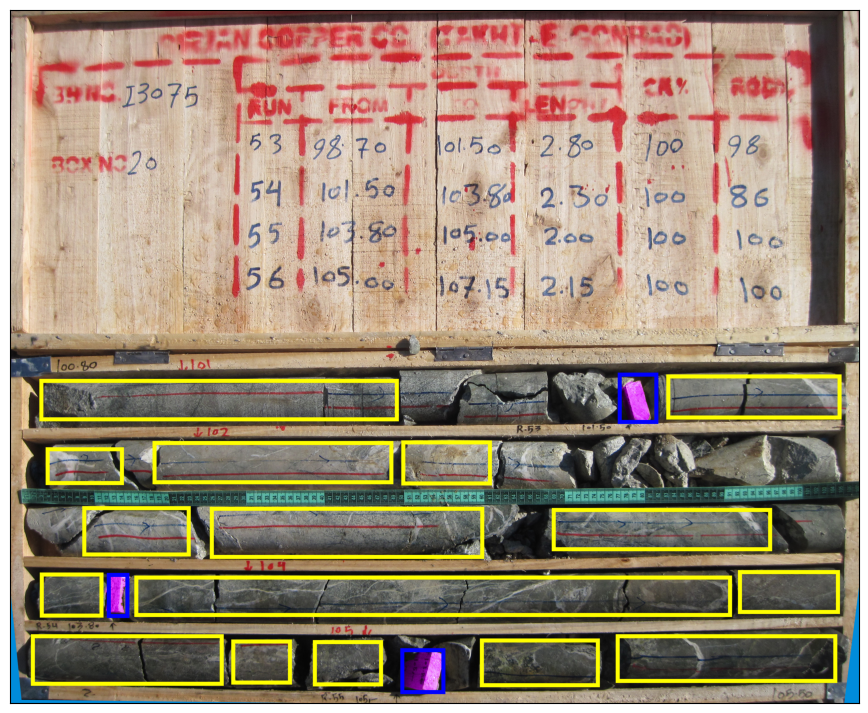

In [13]:
show_bounding_boxe(img_path, 'M3-BH130-20.jpg', labels)

In [14]:
all_img_tensor = img_tensor_load(img_path, df2, transform=transforms.Resize((300,400)))

  0%|          | 0/156 [00:00<?, ?it/s]

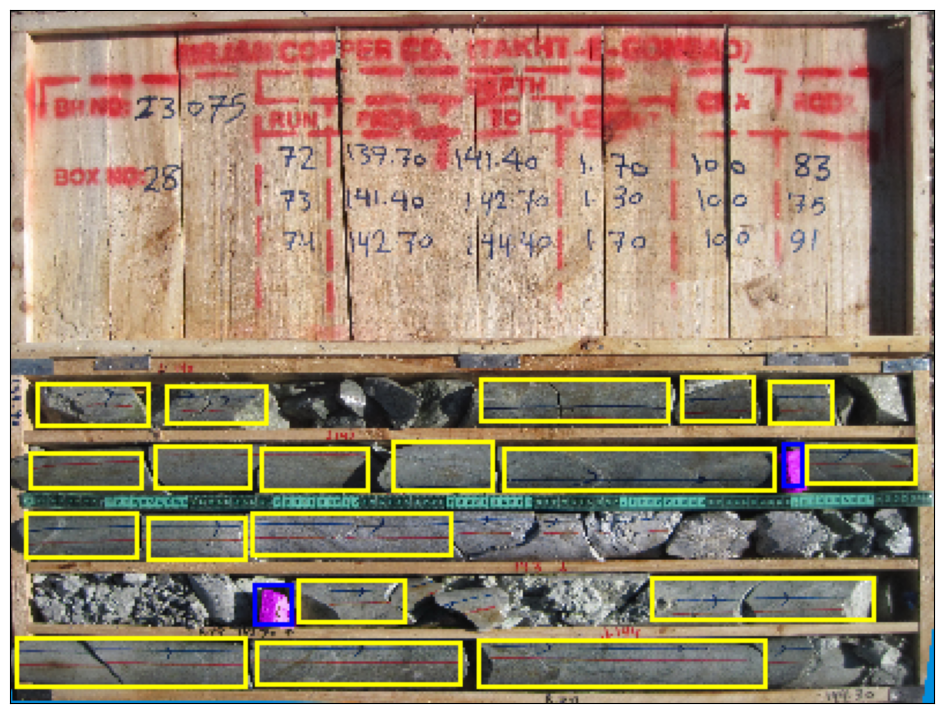

In [15]:
show_bounding_boxe(all_img_tensor[20], df2.File[20], labels, from_ram=True)

In [16]:
targets_dict_list = []
for i in range(len(all_img_tensor)):
    d = {}
    boxes_img, labels_img, _ , _ = boxs_labels_fun(all_img_tensor[i], df2.File[i], labels)
    d['boxes'] = boxes_img
    d['labels'] = labels_img
    targets_dict_list.append(d)

In [17]:
train_indx, valid_indx = valid_train_split(sample_len=len(targets_dict_list), valid_percent=15)

valid size: 23, train size: 136


# Rock Model

In [16]:
from src.hyperparameters import hyperopt_fmin
from src.train import training_plot, train_valid_setup

In [17]:
targets_dict_list_rock = [{'boxes': t['boxes'][t['labels'] == 1], 'labels': t['labels'][t['labels'] == 1]} for t in targets_dict_list]

In [19]:
inputData = [targets_dict_list_rock, all_img_tensor, train_indx, valid_indx]
best_hyperparams, trials = hyperopt_fmin(inputData)

In [21]:
train_loss, valid_loss = train_valid_setup(lr=0.008388406010734754, 
                                          momentum=0.9444939643124248, 
                                          weight_decay=0.007445852010334835, 
                                          batch_size=8, 
                                          num_epochs=40,
                                          train_indx=train_indx, 
                                          valid_indx=valid_indx, 
                                          all_img_tensor=all_img_tensor, 
                                          targets_dict_list=targets_dict_list_rock,
                                          num_classes=2,
                                          modelType={'name':'rock','max':0.75,'patience':4, 'imgT':True})

cuda


  0%|          | 0/40 [00:00<?, ?it/s]

Train Epoch: 1 [80/136 (59%)]	 Loss: 1.382296

Train Epoch: 1 : Average loss: 1.341394
Valid Epoch: 1 : Average loss: 1.127185

Train Epoch: 2 [80/136 (59%)]	 Loss: 1.033757

Train Epoch: 2 : Average loss: 1.031823
Valid Epoch: 2 : Average loss: 1.060645

Train Epoch: 3 [80/136 (59%)]	 Loss: 0.976743

Train Epoch: 3 : Average loss: 0.990379
Valid Epoch: 3 : Average loss: 0.920430

Train Epoch: 4 [80/136 (59%)]	 Loss: 0.908054

Train Epoch: 4 : Average loss: 0.884362
Valid Epoch: 4 : Average loss: 0.878931

Train Epoch: 5 [80/136 (59%)]	 Loss: 0.836693

Train Epoch: 5 : Average loss: 0.813356
Valid Epoch: 5 : Average loss: 0.859000

Train Epoch: 6 [80/136 (59%)]	 Loss: 0.710650

Train Epoch: 6 : Average loss: 0.734403
Valid Epoch: 6 : Average loss: 0.903713

Train Epoch: 7 [80/136 (59%)]	 Loss: 0.699503

Train Epoch: 7 : Average loss: 0.712404
Valid Epoch: 7 : Average loss: 0.804903

Train Epoch: 8 [80/136 (59%)]	 Loss: 0.660482

Train Epoch: 8 : Average loss: 0.646257
Valid Epoch: 8 : 

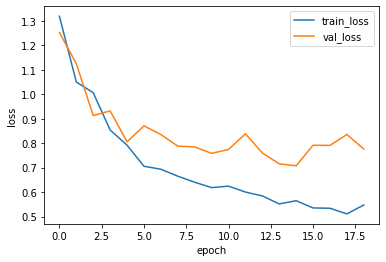

In [ ]:
training_plot(train_loss, valid_loss)

In [25]:
!cp /content/quera_mine_problem/models/checkPoint_rock_model.pth /content/drive/MyDrive

# inference rock model

In [23]:
from src.utils import load_weights_fun, collate_fn, imgs_with_boxes, show
from src.model import model_select
from src.train import img_transform
from torchvision.transforms.functional import convert_image_dtype
import torch

In [24]:
model, optimizer, device = model_select(lr=0.008388406010734754, 
                                          momentum=0.9444939643124248, 
                                          weight_decay=0.007445852010334835, 
                                        num_classes=2)
load_weights_fun('/content/drive/MyDrive/checkPoint_rock_model.pth', model, optimizer)

img_temp = img_transform()(convert_image_dtype(all_img_tensor[valid_indx[0:3]], dtype=torch.float32))

model = model.eval()
outputs = model(img_temp.to(device))

cuda
epoch: 15 valid_loss: 0.6842826008796692 train_loss: 0.5481371476369745
CRNN model reloaded!


In [25]:
imgs_with_boxes_pred = imgs_with_boxes(all_img_tensor[valid_indx[0:3]], 
                                       outputs, 
                                       score_threshold=0.8, 
                                       pred=True)
imgs_with_boxes_true = imgs_with_boxes(all_img_tensor[valid_indx[0:3]],
                                       [targets_dict_list_rock[i] for i in valid_indx], 
                                       score_threshold=0.8, 
                                       pred=False)

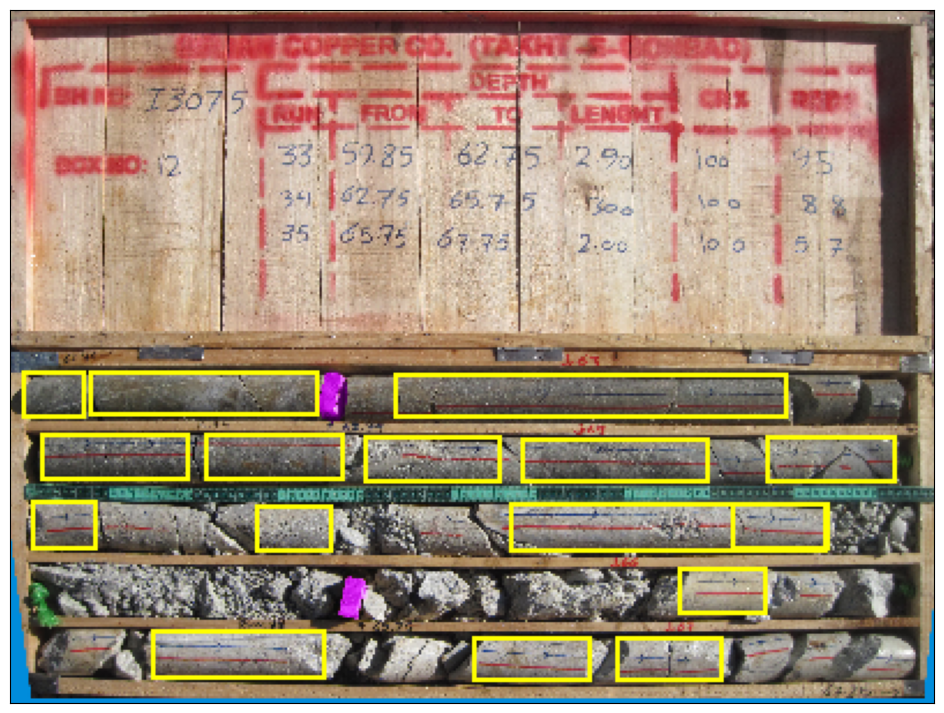

In [26]:
show(imgs_with_boxes_pred[1])

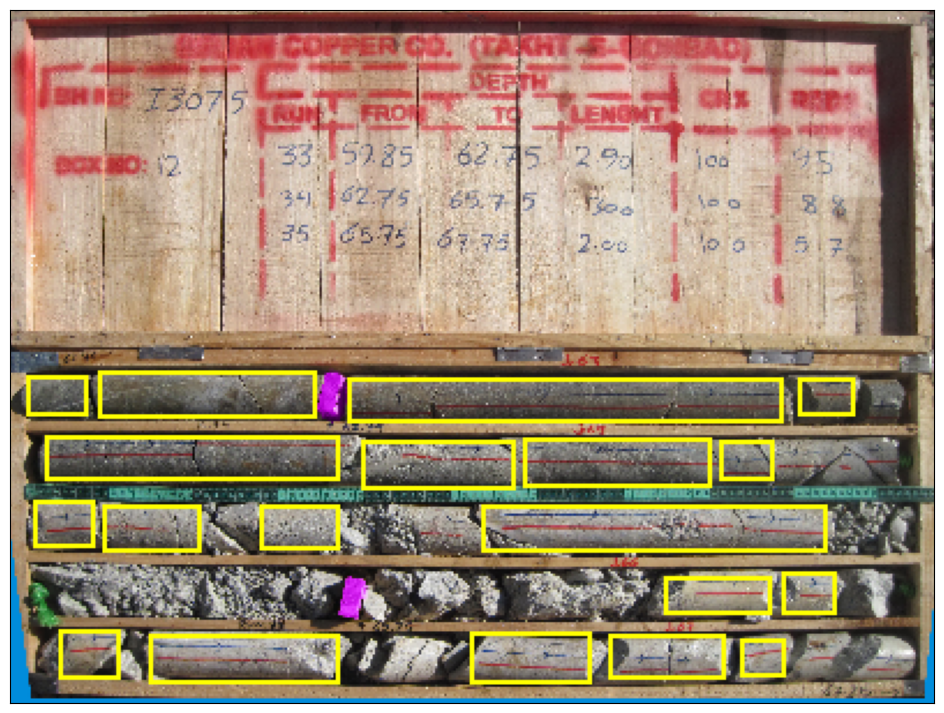

In [26]:
show(imgs_with_boxes_true[1])

# Wood model

In [24]:
from src.hyperparameters import hyperopt_fmin
from src.train import training_plot, train_valid_setup

In [19]:
targets_dict_list_wood = [{'boxes': t['boxes'][t['labels'] == 0], 'labels': t['labels'][t['labels'] == 0]+1} for t in targets_dict_list]

In [30]:
inputData = [targets_dict_list_wood, all_img_tensor, train_indx, valid_indx]
best_hyperparams, trials = hyperopt_fmin(inputData)

In [22]:
train_loss, valid_loss = train_valid_setup(lr=0.006039497039954175, 
                                          momentum=0.9708223564790668, 
                                          weight_decay=0.0014905031197396778, 
                                          batch_size=8, 
                                          num_epochs=40,
                                          train_indx=train_indx, 
                                          valid_indx=valid_indx, 
                                          all_img_tensor=all_img_tensor, 
                                          targets_dict_list=targets_dict_list_wood,
                                          num_classes=2,
                                          modelType={'name':'wood','max':0.30,'patience':4, 'imgT':False})

cuda


  0%|          | 0/40 [00:00<?, ?it/s]

Train Epoch: 1 [80/136 (59%)]	 Loss: 0.625995

Train Epoch: 1 : Average loss: 0.559269
Valid Epoch: 1 : Average loss: 0.453735

Train Epoch: 2 [80/136 (59%)]	 Loss: 0.361878

Train Epoch: 2 : Average loss: 0.363636
Valid Epoch: 2 : Average loss: 0.390413

Train Epoch: 3 [80/136 (59%)]	 Loss: 0.348264

Train Epoch: 3 : Average loss: 0.335122
Valid Epoch: 3 : Average loss: 0.382574

Train Epoch: 4 [80/136 (59%)]	 Loss: 0.326670

Train Epoch: 4 : Average loss: 0.309221
Valid Epoch: 4 : Average loss: 0.311542

Train Epoch: 5 [80/136 (59%)]	 Loss: 0.271307

Train Epoch: 5 : Average loss: 0.273381
Valid Epoch: 5 : Average loss: 0.344829

Train Epoch: 6 [80/136 (59%)]	 Loss: 0.278432

Train Epoch: 6 : Average loss: 0.269025
Valid Epoch: 6 : Average loss: 0.305084

Train Epoch: 7 [80/136 (59%)]	 Loss: 0.272570

Train Epoch: 7 : Average loss: 0.264941
Valid Epoch: 7 : Average loss: 0.328800

Train Epoch: 8 [80/136 (59%)]	 Loss: 0.253103

Train Epoch: 8 : Average loss: 0.251674
Valid Epoch: 8 : 

In [ ]:
!cp /content/quera_mine_problem/models/checkPoint_wood_model.pth /content/drive/MyDrive

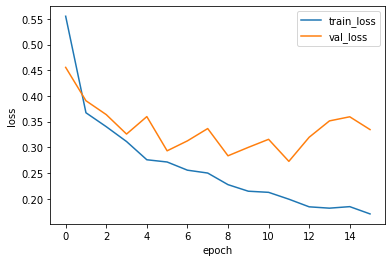

In [ ]:
training_plot(train_loss, valid_loss)

# inference wood model

In [30]:
from src.utils import load_weights_fun, collate_fn, imgs_with_boxes, show
from src.model import model_select
from src.train import img_transform
from torchvision.transforms.functional import convert_image_dtype
import torch

In [31]:
model, optimizer, device = model_select(lr=0.006039497039954175, 
                                        momentum=0.9708223564790668, 
                                        weight_decay=0.0014905031197396778, 
                                        num_classes=2)
load_weights_fun('/content/drive/MyDrive/checkPoint_wood_model.pth', model, optimizer)

img_temp = convert_image_dtype(all_img_tensor[valid_indx[0:3]], dtype=torch.float32)

model = model.eval()
outputs = model(img_temp.to(device))

cuda
epoch: 12 valid_loss: 0.2727706730365753 train_loss: 0.1991928482756895
CRNN model reloaded!


In [32]:
imgs_with_boxes_pred = imgs_with_boxes(all_img_tensor[valid_indx[0:3]], 
                                       outputs, 
                                       score_threshold=0.8, 
                                       pred=True)
imgs_with_boxes_true = imgs_with_boxes(all_img_tensor[valid_indx[0:3]],
                                       [targets_dict_list_wood[i] for i in valid_indx[0:3]], 
                                       score_threshold=0.8, 
                                       pred=False)

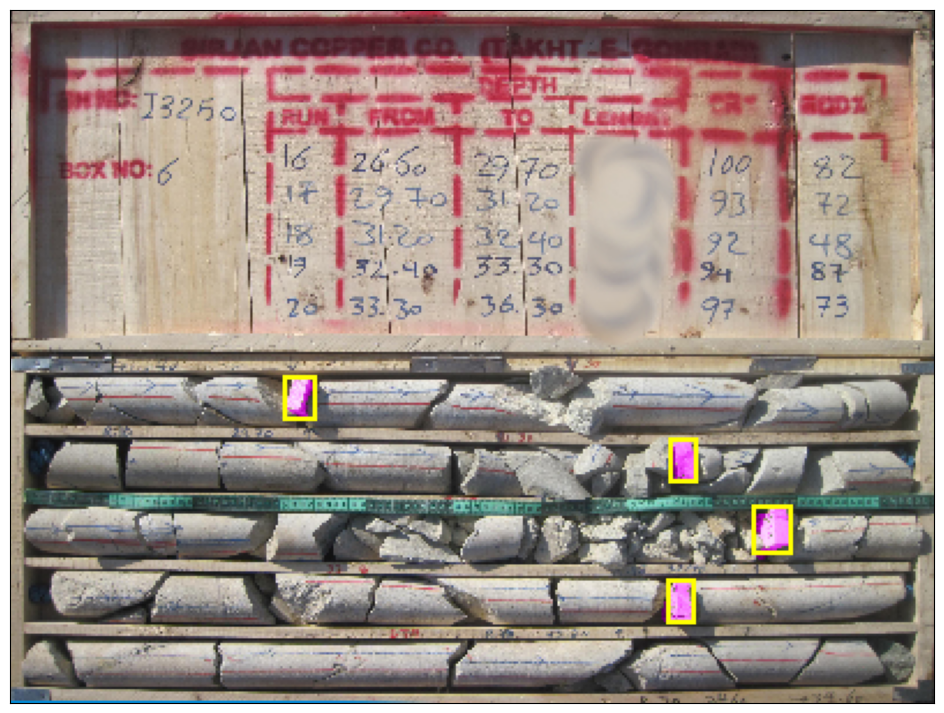

In [33]:
show(imgs_with_boxes_pred[0])

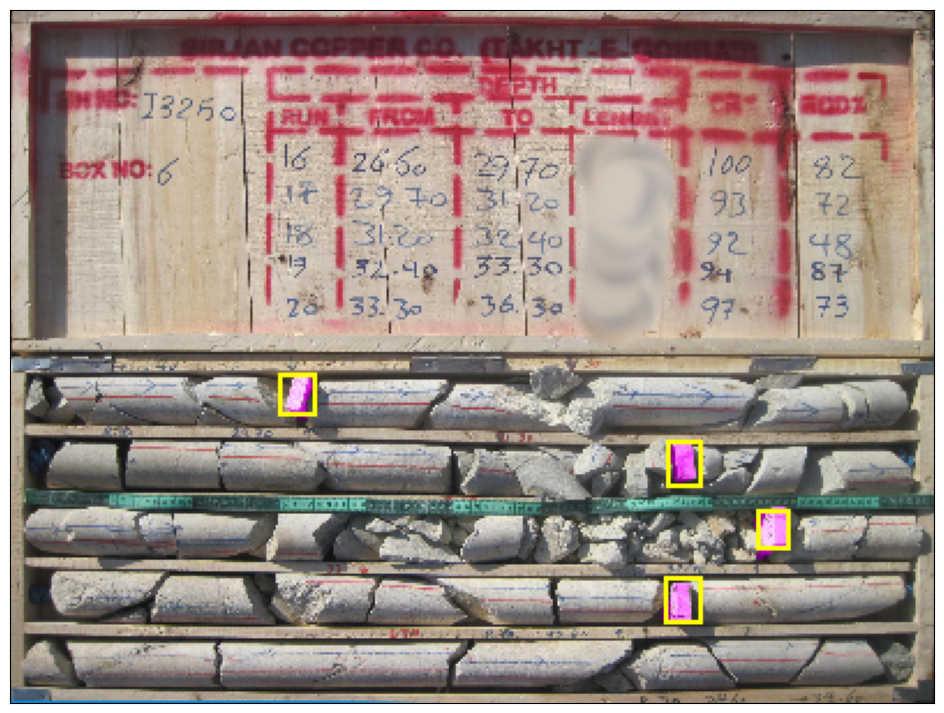

In [34]:
show(imgs_with_boxes_true[0])

## Inference Test dataset

## load data

In [35]:
img_test_path = 'data/test-rqd/'
run_depth_path = 'data/from-to-rqd.xlsx'

In [36]:
# Detect devices
use_cuda = torch.cuda.is_available()                   # check if GPU exists
device = torch.device("cuda" if use_cuda else "cpu")   # use CPU or GPU
print(device)

dir_name_test = sorted(os.listdir(img_test_path))

df2_test = pd.DataFrame(data=[file_nm.split('.')[0].split('-') for file_nm in dir_name_test], columns=['Mine', 'Borehole', 'Box_num'])
df2_test['File'] = dir_name_test

all_img_tensor_test = img_tensor_load(img_test_path, df2_test, transform=transforms.Resize((300,400)))

df = pd.read_excel(run_depth_path)

cuda


  0%|          | 0/48 [00:00<?, ?it/s]

## load model

In [37]:
from src.postprocessing import inference_test_data, calculate_sub

In [38]:
output_rock_list, output_wood_list = inference_test_data(all_img_tensor_test, 
                                                        device,
                                                        rock_model_path='/content/drive/MyDrive/checkPoint_rock_model.pth', 
                                                        wood_model_path='/content/drive/MyDrive/checkPoint_wood_model.pth', 
                                                        score_threshold=0.8, 
                                                        box_iou_threshold=0.1)

cuda
epoch: 12 valid_loss: 0.2727706730365753 train_loss: 0.1991928482756895
CRNN model reloaded!
cuda
epoch: 15 valid_loss: 0.6842826008796692 train_loss: 0.5481371476369745
CRNN model reloaded!
start predicting boxes!


  0%|          | 0/6 [00:00<?, ?it/s]

combine predicted boxes!


  0%|          | 0/48 [00:00<?, ?it/s]

In [39]:
from src.utils import imgs_with_boxes, show

In [40]:
outputs = []
for i, j in zip(output_wood_list, output_rock_list):
  outputs.append( {'boxes':torch.cat([i,j]), 'labels':[0 for jj in range(len(i))] + [1 for jj in range(len(j))]} )

img_with_boxes_pred = imgs_with_boxes(all_img_tensor_test, 
                                       outputs, 
                                       score_threshold=0.8, 
                                       pred=False)

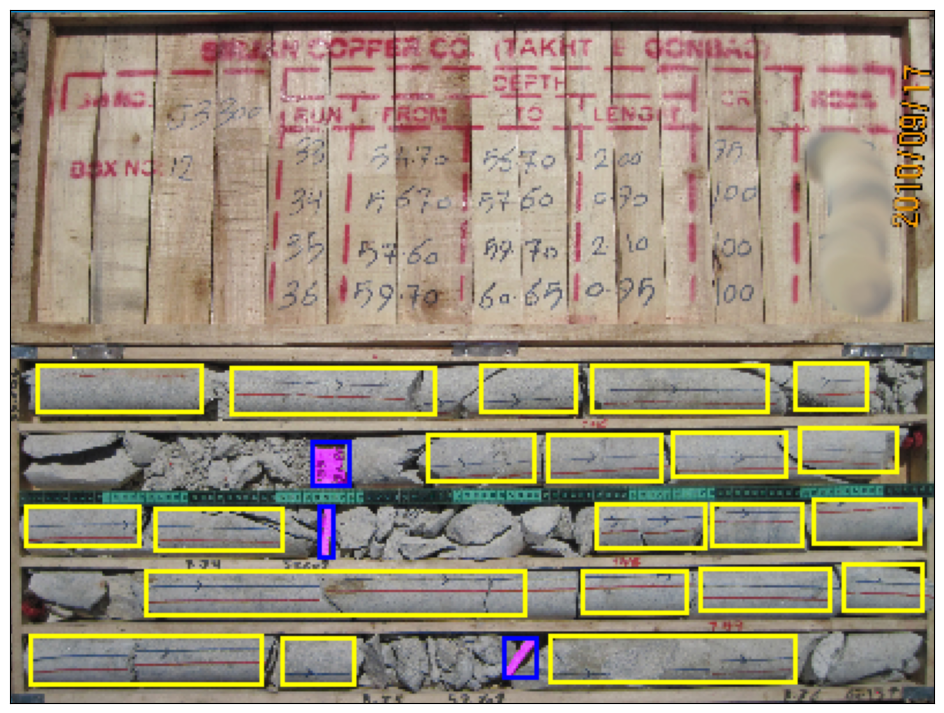

In [41]:
show(img_with_boxes_pred[12])

In [42]:
df['File'] = ['-'.join(i.split('-')[:-1])+'.jpg' for i in df.RunId]

runs_dep_dict = df.groupby('File').apply(lambda g: list(100*(g['to'] - g['from']).values) ).to_dict()
runs_dep_list = [runs_dep_dict[i] for i in df2_test.File.to_list()]

In [43]:
sub = calculate_sub(output_rock_list, output_wood_list, runs_dep_list, df2_test, device)

In [44]:
sub

array([['RunId', 'Prediction'],
       ['M3-BH3299-1-1', '1'],
       ['M3-BH3299-1-2', '2'],
       ['M3-BH3299-1-3', '2'],
       ['M3-BH3299-2-1', '2'],
       ['M3-BH3299-2-2', '1'],
       ['M3-BH3299-2-3', '1'],
       ['M3-BH3299-2-4', '2'],
       ['M3-BH3299-2-5', '1'],
       ['M3-BH3299-2-6', '1'],
       ['M3-BH3299-3-1', '3'],
       ['M3-BH3299-3-2', '1'],
       ['M3-BH3299-3-3', '1'],
       ['M3-BH3299-3-4', '1'],
       ['M3-BH3299-3-5', '1'],
       ['M3-BH3299-4-1', '1'],
       ['M3-BH3299-4-2', '1'],
       ['M3-BH3299-4-3', '1'],
       ['M3-BH3299-4-4', '2'],
       ['M3-BH3299-5-1', '3'],
       ['M3-BH3299-5-2', '1'],
       ['M3-BH3299-5-3', '1'],
       ['M3-BH3299-5-4', '1'],
       ['M3-BH3299-6-1', '1'],
       ['M3-BH3299-6-2', '1'],
       ['M3-BH3299-6-3', '1'],
       ['M3-BH3299-7-1', '1'],
       ['M3-BH3299-7-2', '1'],
       ['M3-BH3299-7-3', '1'],
       ['M3-BH3299-7-4', '1'],
       ['M3-BH3299-7-5', '1'],
       ['M3-BH3299-8-1', '1'],
       